<center>
    <img src='images/logo.png' width='400px'>
    <h1>MÔN HỌC: THỊ GIÁC MÁY TÍNH (7080518)</h1>
<h2> Chương 2: XỬ LÝ VÀ NÂNG CAO CHẤT LƯỢNG ẢNH - Phần 1</h2>
</center>

---
Xử lý ảnh (Image processing): là quá trình tạo ra ảnh mới từ ảnh có sẵn, VD: tăng độ sáng, cắt ảnh, khử nhiễu,… không tập trung vào việc hiểu nội dung của bức ảnh.

**Nội dung bài học - phần 1:**

**I. Một số kỹ thuật xử lý ảnh cơ bản:**
1. Thay đổi kích thước ảnh (Resizing images)
2. Cắt ảnh (Cropping images)
3. Xoay ảnh (Rotate images)
4. Lật ảnh (Flip images)
---
*Copyright @dangvannam.FIT.HUMG*

In [1]:
#Khai báo sử dụng thư viện:
import numpy as np
import matplotlib.pyplot as plt
import cv2
print('Version OpenCV:', cv2.__version__)

#--------------------------------
import warnings
warnings.filterwarnings("ignore")

Version OpenCV: 4.9.0


### 1.1 Thay đổi kích thước ảnh (Resizing images)
---
* Thay đổi kích thước (Zoom in, Zoom out) là một trong những kỹ thuật xử lý ảnh thông dụng.
* Ảnh có kích thước lớn sẽ chiếm nhiều bộ nhớ, số lượng tập dữ liệu ảnh thường rất lớn. Do đó cần giảm kích thước ảnh. Resize là một kỹ thuật phổ biến. => Trong OpenCV, Sử dụng hàm cv2.resize

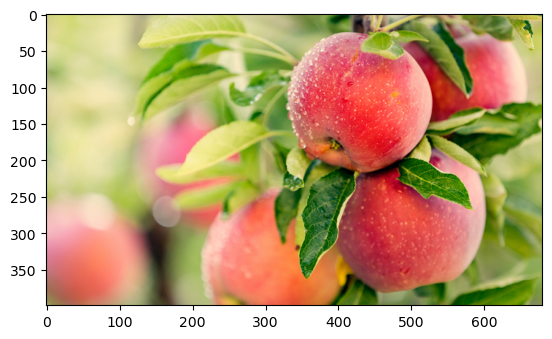

In [2]:
#Đọc ảnh:
img_orignal = cv2.imread('images/apples.jpg',1)

#Chuyển sang hệ màu RGB để hiện thị:
img_orignal = cv2.cvtColor(img_orignal,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh gốc:
plt.imshow(img_orignal)
plt.show()

In [3]:
#Lấy kích thước ảnh ban đầu:
h = img_orignal.shape[0]
w = img_orignal.shape[1]
print('Độ phân giải ảnh ban đầu:',h,'x',w)

Độ phân giải ảnh ban đầu: 399 x 680


In [4]:
# số pixel 
print(img_orignal.size)

813960


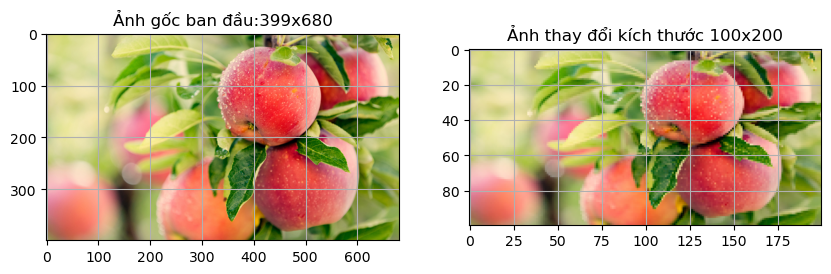

In [5]:
#Thay đổi kích thước ảnh về độ phân giải: 100 x 200
dsize = (200,100) #Lưu ý thứ tự (Width, Height)

#Sử dụng phương thức resize():
img_100x200 = cv2.resize(img_orignal,
                         dsize, 
                         interpolation=cv2.INTER_LINEAR) 

#Hiển thị ảnh gốc và ảnh thay đổi kích thước
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)

plt.imshow(img_orignal)
st = 'Ảnh gốc ban đầu:' + str(h) +  'x' + str(w)
plt.title(st)
plt.grid()

plt.subplot(1, 2, 2)
plt.imshow(img_100x200)
plt.title('Ảnh thay đổi kích thước 100x200')
plt.grid()

plt.show()

In [6]:
#Lưu ảnh sau resize:
cv2.imwrite('images/Apples_100x200.jpg',
            cv2.cvtColor(img_100x200,cv2.COLOR_RGB2BGR))

True

In [7]:
# số pixel điểm ảnh đã thay đổi
print('Ảnh gốc: ', img_orignal.size)
print('Ảnh thu nhỏ: ',img_100x200.size)

Ảnh gốc:  813960
Ảnh thu nhỏ:  60000


## Các tham số của phương thức resize:
---

**cv2.resize(src, dsize, interpolation)**

Ý nghĩa các tham số:

1. src: ảnh gốc cần thay đổi kích thước.
2. dsize (width, height): Kích thước ảnh muốn thay đổi
3. interpolation: chỉ định thuật toán thực hiện resize:
* INTER_NEAREST – nội suy láng giềng gần nhất
* INTER_LINEAR – nội suy song tuyến tính (mặc định)
* INTER_AREA – resampling using pixel area relation. It may be a preferred method for image decimation, as it gives moire’-free results. But when the image is zoomed, it is similar to the INTER_NEAREST method.
* INTER_CUBIC –  nội suy xoắn bậc 3, trên  4×4 pixel láng giềng
* INTER_LANCZOS4 –  nội suy Lanczos trên 8×8 pixel láng giềng!




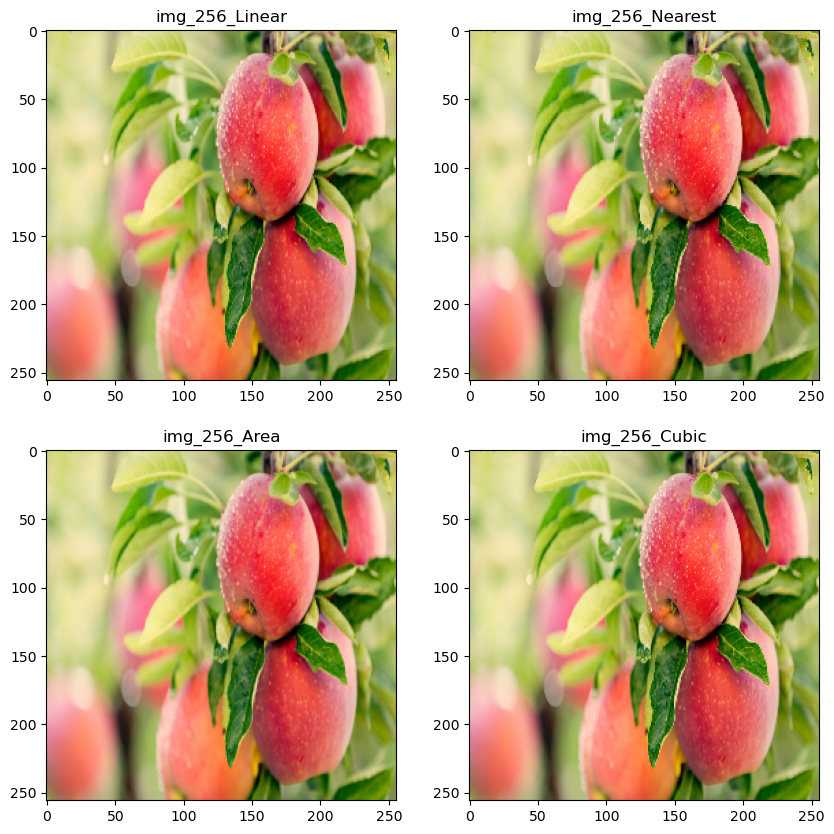

In [8]:
#Resize ảnh với các thuật toán khác nhau:
dsize = (256,256)

#INTER_LINEAR (thuật toán mặc định):
img_256_Linear = cv2.resize(img_orignal,dsize,
                            interpolation=cv2.INTER_LINEAR)

#INTER_NEAREST:
img_256_Nearest = cv2.resize(img_orignal,dsize,
                             interpolation=cv2.INTER_NEAREST)

#INTER_AREA:
img_256_Area = cv2.resize(img_orignal, dsize,
                          interpolation=cv2.INTER_AREA)

#INTER_CUBIC
img_256_Cubic = cv2.resize(img_orignal,dsize,
                           interpolation=cv2.INTER_CUBIC)

#Hiển thị ảnh gốc và ảnh thay đổi kích thước với các thuật toán khác nhau
plt.figure(figsize=(10,10))
plt.subplot(2, 2, 1)
plt.imshow(img_256_Linear)
plt.title('img_256_Linear')

plt.subplot(2, 2, 2)
plt.imshow(img_256_Nearest)
plt.title('img_256_Nearest')

plt.subplot(2, 2, 3)
plt.imshow(img_256_Area)
plt.title('img_256_Area')

plt.subplot(2, 2, 4)
plt.imshow(img_256_Cubic)
plt.title('img_256_Cubic')

plt.show()

**Thông thường:**
* cv.INTER_AREA để thu nhỏ
* cv.INTER_CUBIC & cv.INTER_LINEAR để zoom.

In [9]:
#Lấy kích thước ảnh ban đầu:
h = img_orignal.shape[0]
w = img_orignal.shape[1]
print('Độ phân giải ảnh ban đầu:',h,'x',w)

Độ phân giải ảnh ban đầu: 399 x 680


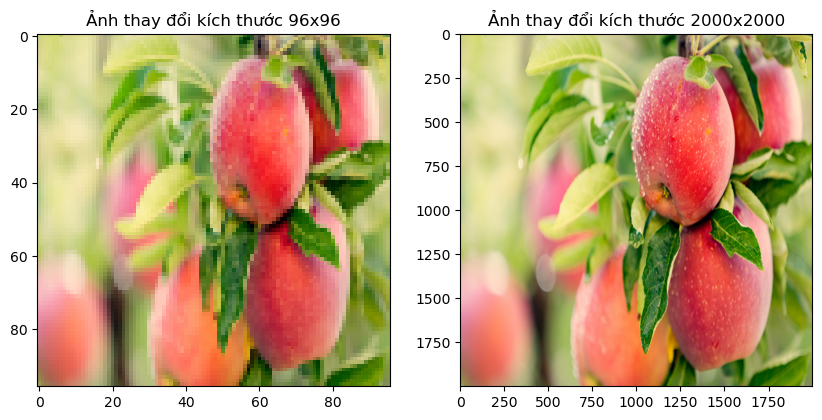

In [10]:
dzoom_in = (96,96)      #Thiết lập kích thước Thu nhỏ hình ảnh
dzoom_out = (2000,2000) #Thiết lập kích thước Phóng to hình ảnh

#Thu nhỏ:
img_96 = cv2.resize(img_orignal,
                    dzoom_in,
                    interpolation=cv2.INTER_AREA)

#Phóng phóng to:
img_2000 = cv2.resize(img_orignal,
                      dzoom_out,
                      interpolation=cv2.INTER_CUBIC)

#Lưu ảnh:
cv2.imwrite('images/Apples_96.jpg',cv2.cvtColor(img_96,cv2.COLOR_RGB2BGR))
cv2.imwrite('images/Apples_2000.jpg',cv2.cvtColor(img_2000,cv2.COLOR_RGB2BGR))

#Hiển thị kết quả
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(img_96)
plt.title('Ảnh thay đổi kích thước 96x96')

plt.subplot(1, 2, 2)
plt.imshow(img_2000)
plt.title('Ảnh thay đổi kích thước 2000x2000')

plt.show()

In [11]:
print('Độ phân giải ảnh ban đầu:',h,'x',w)

Độ phân giải ảnh ban đầu: 399 x 680


Kích thước ảnh góc 808 x 650


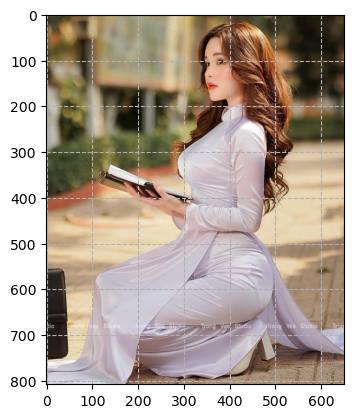

In [12]:
#Thay đổi kích thước ảnh theo tỷ lệ % (scale) nhập vào: 
# Nếu scale <100 thu nhỏ 
# Nếu scale = 100 giữ nguyên
# Nếu scale>100 phóng to



# Đọc ảnh
pic = cv2.imread('images/pic_1.jpg',1)

#Hiên thị kích thước ảnh gốc
h_sv = pic.shape[0]
w_sv = pic.shape[1]
print ('Kích thước ảnh góc',h_sv,'x',w_sv)

# Hiển thị kích thước ảnh gốc
plt.imshow(cv2.cvtColor(pic,cv2.COLOR_BGR2RGB))
plt.grid(ls='--')
plt.show()




Nhập tỷ lệ % muốn thay đổi: 55
Tỷ lệ thay đổi:  55 (%)
Kích thước ảnh gốc:  808 x 650
Kích thước ảnh thay đổi:  444 x 357


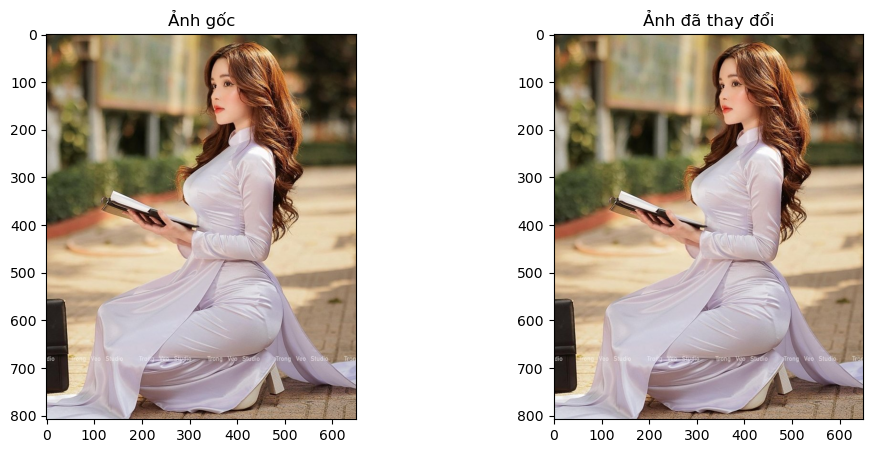

In [13]:
# Nhập tham số scale
scale = input('Nhập tỷ lệ % muốn thay đổi: ')
print('Tỷ lệ thay đổi: ',scale, '(%)')

h_sv_new = int(scale) * h_sv//100
w_sv_new = int(scale) * w_sv//100

print('Kích thước ảnh gốc: ',h_sv,'x',w_sv)
print('Kích thước ảnh thay đổi: ',h_sv_new,'x',w_sv_new)

d_pic = (w_sv_new, h_sv_new)
# thay đổi kích thước ảnh gốc
pic_new = cv2.resize(pic,
                    d_pic,
                    interpolation=cv2.INTER_AREA)
# Hiển thị kết quả ảnh thay đổi
plt.figure(figsize = (12,5))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(pic,cv2.COLOR_BGR2RGB))
plt.title('Ảnh gốc')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(pic,cv2.COLOR_BGR2RGB))
plt.title('Ảnh đã thay đổi')

plt.show()

## THỰC HÀNH 2.1: 
---
**Yêu cầu 1:** Sinh viên đọc ảnh màu images/Thuchanh_2_1.jpg và chuyển đổi sang hệ RGB, hiển thị ảnh

**Yêu cầu 2:** Cho biết chiều cao, chiều rộng và số pixel điểm ảnh.

**Yêu cầu 3:** Thực hiện thay đổi kích thước theo yêu cầu sau:

    3.1. Thay đổi kích thước ảnh về 32x32, sử dụng tham số interpolation mặc định. Hiển thị kết quả và Lưu lại ảnh vào thư mục images/Saves/MSV_img_31.jpg theo hệ màu BGR
    
    3.2. Giữ nguyên chiều cao của ảnh gốc, giảm chiều rộng ảnh đi một nửa, Sử dụng phương pháp INTER_NEAREST.Hiển thị kết quả và Lưu lại ảnh vào thư mục images/Saves/MSV_img_32.jpg theo hệ màu BGR
    
    3.3. Tăng chiều cao của ảnh lên gấp đôi, giữ nguyên chiều rộng của ảnh gốc; Sử dụng phương pháp INTER_LANCZOS4. Hiển thị kết quả và Lưu lại ảnh vào thư mục images/Saves/MSV_img_33.jpg theo hệ màu BGR

Text(0.5, 1.0, 'Ảnh hoa hồng')

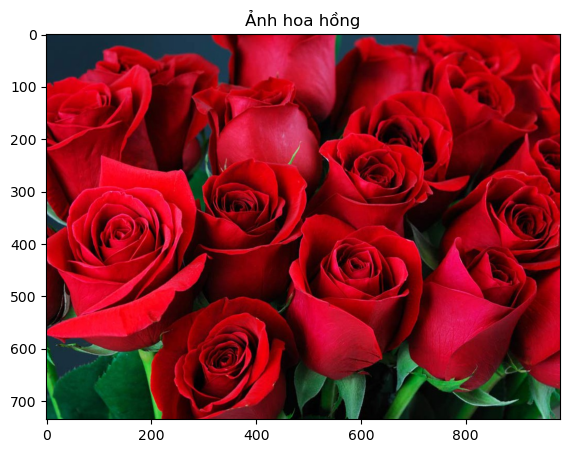

In [14]:
#{SINH VIÊN VIẾT CODE Ở ĐÂY:}
# yêu cầu 1: 
#1. Đọc ảnh và hiển thị ảnh:
img_flower = cv2.imread('images/Thuchanh_2_1.jpg',1)
# Hiển thị kết quả ảnh thay đổi
plt.figure(figsize = (12,5))
plt.imshow(cv2.cvtColor(img_flower,cv2.COLOR_BGR2RGB))
plt.title('Ảnh hoa hồng')

In [15]:
#2. Chiều cao, chiều rộng và số pixel điểm ảnh:
#Hiên thị kích thước ảnh gốc
h_flo = img_flower.shape[0]
w_flo = img_flower.shape[1]
print ('Kích thước ảnh (height x width): ',h_flo,'x',w_flo)

# sô pixel điểm ảnh
print('Số pixel điểm ảnh: ',h_flo*w_flo)

Kích thước ảnh (height x width):  735 x 980
Số pixel điểm ảnh:  720300


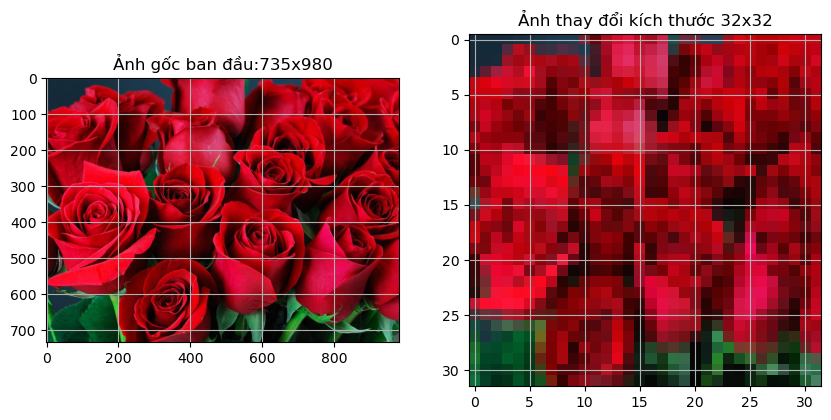

In [16]:
#3. Thực hiện thay đổi kích thước theo yêu cầu sau:
#3.1. Thay đổi kích thước ảnh về 32x32, sử dụng tham số interpolation mặc định. 
# Hiển thị kết quả và Lưu lại ảnh vào thư mục Saves/MSV_img_1.jpg theo hệ màu BGR

dsize = (32,32) #Lưu ý thứ tự (Width, Height)

#Sử dụng phương thức resize():
img_32x32 = cv2.resize(img_flower,
                         dsize, 
                         interpolation=cv2.INTER_AREA) 

# Hiển thị kết quả ảnh thay đổi
#Hiển thị ảnh gốc và ảnh thay đổi kích thước
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_flower,cv2.COLOR_BGR2RGB))
st = 'Ảnh gốc ban đầu:' + str(h_flo) +  'x' + str(w_flo)
plt.title(st)
plt.grid('--')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_32x32,cv2.COLOR_BGR2RGB))
plt.title('Ảnh thay đổi kích thước 32x32')
plt.grid()

plt.show()


In [17]:
# Lưu ảnh vừa lưu vào thư mục
cv2.imwrite('images/Saves/2121050720_img_1.jpg', img_32x32)

True

Kích thước mới của ảnh (Width, Height):  (490, 735)
Số pixel điểm ảnh:  360150


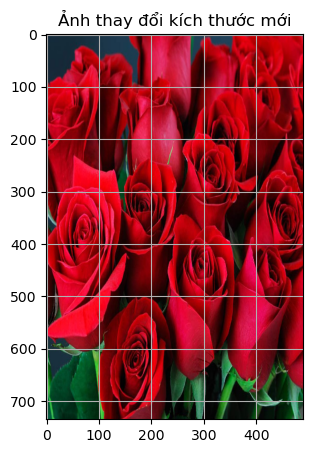

In [18]:
#3.2. Giữ nguyên chiều cao của ảnh gốc, giảm chiều rộng ảnh đi một nửa, 
#Sử dụng phương pháp INTER_NEAREST.
#Hiển thị kết quả và Lưu lại ảnh vào thư mục images/Saves/MSV_img_2.jpg theo hệ màu BGR
# tạo kích thước mới cho ảnh hoa hồng
new_dsize1 = (w_flo//2,h_flo)
print('Kích thước mới của ảnh (Width, Height): ',new_dsize1)
print('Số pixel điểm ảnh: ', h_flo*(w_flo//2))
new_flo_img1 = cv2.resize(img_flower,
                         new_dsize1, 
                         interpolation=cv2.INTER_NEAREST) 
plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(new_flo_img1,cv2.COLOR_BGR2RGB))
plt.title('Ảnh thay đổi kích thước mới')
plt.grid('--')
plt.show()



In [19]:
# Lưu ảnh vừa resize
cv2.imwrite('images/Saves/2121050720_img_2.jpg', new_flo_img1)

True

Kích thước mới của ảnh (Width, Height):  (980, 1470)
Số pixel điểm ảnh:  1440600


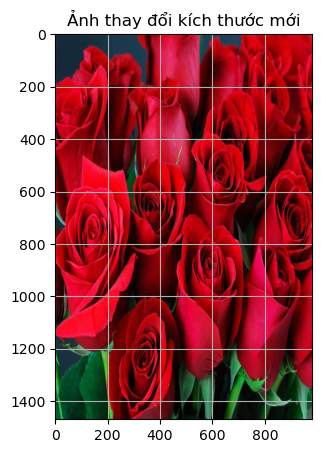

In [20]:
#3.3 Tăng chiều cao của ảnh lên gấp đôi, giữ nguyên chiều rộng của ảnh gốc; 
#Sử dụng phương pháp INTER_LANCZOS4. 
#Hiển thị kết quả và Lưu lại ảnh vào thư mục images/Saves/MSV_img_3.jpg theo hệ màu BGR
new_dsize2 = (w_flo,h_flo*2)
print('Kích thước mới của ảnh (Width, Height): ',new_dsize2)
print('Số pixel điểm ảnh: ', (h_flo*2)*w_flo)
new_flo_img2 = cv2.resize(img_flower,
                         new_dsize2, 
                         interpolation=cv2.INTER_NEAREST) 
plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(new_flo_img2,cv2.COLOR_BGR2RGB))
plt.title('Ảnh thay đổi kích thước mới')
plt.grid('--')
plt.show()




In [21]:
cv2.imwrite('images/Saves/2121050720_img_3.jpg', new_flo_img2)

True

## THỰC HÀNH 2.1 (Tiếp): 
---
Thay đổi kích thước nhiều ảnh:

**Yêu cầu 4:** Sinh viên sử dụng thư mục chứa các ảnh đã đổi tên thực hiện trong bài thực hành 1.3 chương 1. Thực hiện thay đổi kích thước toàn bộ ảnh về độ phân giải 96x96 pixel. Lưu lại ảnh đã thay đổi vào thư mục mới có tên Pic_96 và đặt lại tên ảnh như sau: Pic_96_i.jpg với i là các số thứ tự của ảnh.


In [22]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY}


#Gọi thư viện
import os 
import shutil

# Đường dẫn tới thư mục ảnh:
path_original = 'images/New/'

#Hiển thị danh sách file ảnh gốc.
print("Danh sách file ảnh:")
for count, filename in enumerate(os.listdir(path_original)): 
    print(count+1,')',filename)




Danh sách file ảnh:
1 ) 201_2121050720_0.jpg
2 ) 201_2121050720_1.jpg
3 ) 201_2121050720_10.jpg
4 ) 201_2121050720_11.jpg
5 ) 201_2121050720_12.jpg
6 ) 201_2121050720_13.jpg
7 ) 201_2121050720_14.jpg
8 ) 201_2121050720_15.jpg
9 ) 201_2121050720_16.jpg
10 ) 201_2121050720_17.jpg
11 ) 201_2121050720_18.jpg
12 ) 201_2121050720_19.jpg
13 ) 201_2121050720_2.jpg
14 ) 201_2121050720_3.jpg
15 ) 201_2121050720_4.jpg
16 ) 201_2121050720_5.jpg
17 ) 201_2121050720_6.jpg
18 ) 201_2121050720_7.jpg
19 ) 201_2121050720_8.jpg
20 ) 201_2121050720_9.jpg


In [23]:
#Viết hàm renamefile() đổi tên các file ảnh trong cùng một thư mục
import os 
import shutil
  
#Hàm xóa các file trong một thư mục:
def delete_files_in_directory(directory_path):
    files = os.listdir(directory_path)
    for file in files:
        file_path = os.path.join(directory_path, file)
        if os.path.isfile(file_path):
            os.remove(file_path)
            
# Hàm sao chép và đổi tên file:
def copy_renamefile(path_old, path_new,name_new): 
    try:
    #xóa tất cả các file cũ của thư mục lưu:
        delete_files_in_directory(path_new)
    #Thiết lập chỉ số cho tên file mới 
        for count, filename in enumerate(os.listdir(path_old)): 
        #Lấy tên file  cũ:
            src = path_old + filename 
        #thiết lập tên file mong muốn đổi:
            dst = path_new + name_new + str(count) + ".jpg"    
        # Sao chép và Thay thế file cũ bằng file mới 
            dest = shutil.copyfile(src, dst)
        print('Sao chép và đổi tên file thành công!')
    except OSError:
        print('Lỗi xử lý')
    

In [24]:
#Thiết lập đường dẫn và tên file mới:
path_new = 'images/Pic_96/'
name_new = 'Pic_96_'

In [25]:
#Gọi hàm đổi tên file:
copy_renamefile(path_original,path_new,name_new)

#Hiển thị danh sách file sau khi đã đổi tên.
for count, filename in enumerate(os.listdir(path_new)): 
    print(count+1,')',filename)

Sao chép và đổi tên file thành công!
1 ) Pic_96_0.jpg
2 ) Pic_96_1.jpg
3 ) Pic_96_10.jpg
4 ) Pic_96_11.jpg
5 ) Pic_96_12.jpg
6 ) Pic_96_13.jpg
7 ) Pic_96_14.jpg
8 ) Pic_96_15.jpg
9 ) Pic_96_16.jpg
10 ) Pic_96_17.jpg
11 ) Pic_96_18.jpg
12 ) Pic_96_19.jpg
13 ) Pic_96_2.jpg
14 ) Pic_96_3.jpg
15 ) Pic_96_4.jpg
16 ) Pic_96_5.jpg
17 ) Pic_96_6.jpg
18 ) Pic_96_7.jpg
19 ) Pic_96_8.jpg
20 ) Pic_96_9.jpg


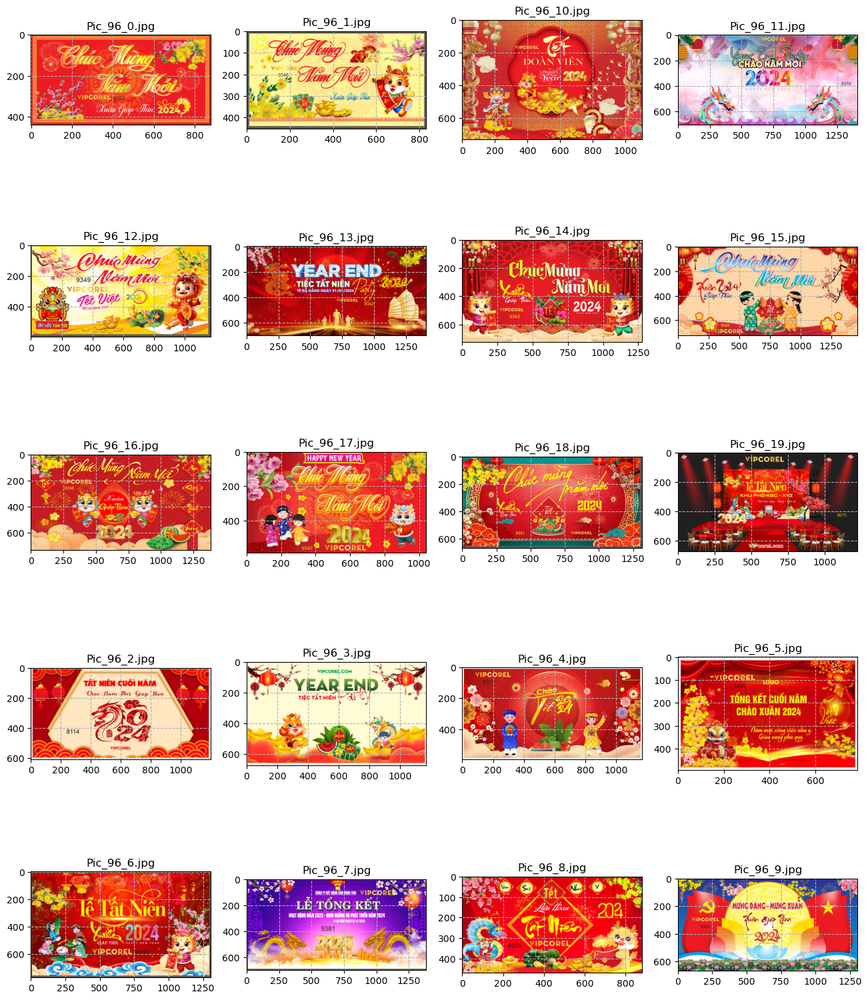

In [29]:
#HIỂN THỊ TOÀN BỘ ẢNH TRONG THƯ MỤC
import pathlib
#Lấy danh sách tên file có trong thư mục
pic_2024_new = list(pathlib.Path(path_new).glob('*'))

#Thiết lập kiểu hiển thị
cot = 4
hang = len(pic_2024_new)//cot + 1

#Hiển thị nhiều ảnh sử dụng Matplotlib:
plt.figure(figsize=(4*cot,4*hang))
for count, filename in enumerate(pic_2024_new):
    #Đọc từng ảnh theo chế độ mặc định
    img = cv2.imread(str(filename))
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    #Thiết lập khung hiển thị gồm 5 hàng và 4 cột
    ax = plt.subplot(hang,cot,count+1)
    #Hiển thị ảnh
    plt.imshow(img)
    #lấy tên file hiển thị
    plt.title(str(filename).split("\\")[-1])
    plt.grid(ls='--')
    plt.axis('on')
    
plt.show()

In [30]:
# input_directory_path = 'images/Original/'
# output_image_path = 'images/Pic_96/'

In [31]:
# {SINH VIÊN VIẾT CODE VÀO ĐÂY}

from PIL import Image
import os

def resize_images_in_directory(input_directory_path, output_directory_path, size):
    # Lấy danh sách tất cả các tệp trong thư mục đầu vào
    files = os.listdir(input_directory_path)

    for file in files:
        # Kiểm tra xem tệp có phải là ảnh không
        if file.endswith(('.png', '.jpg', '.jpeg')):
            # Tạo đường dẫn đầy đủ cho ảnh gốc và ảnh đã thay đổi kích thước
            input_image_path = os.path.join(input_directory_path, file)
            output_image_path = os.path.join(output_directory_path, file)

            # Mở ảnh gốc
            original_image = Image.open(input_image_path)

            # Thay đổi kích thước ảnh
            resized_image = original_image.resize(size)

            # Lưu ảnh đã thay đổi kích thước
            resized_image.save(output_image_path)

# Sử dụng hàm
resize_images_in_directory('images/Pic_96/', 'images/Pic_96/', (96, 96))



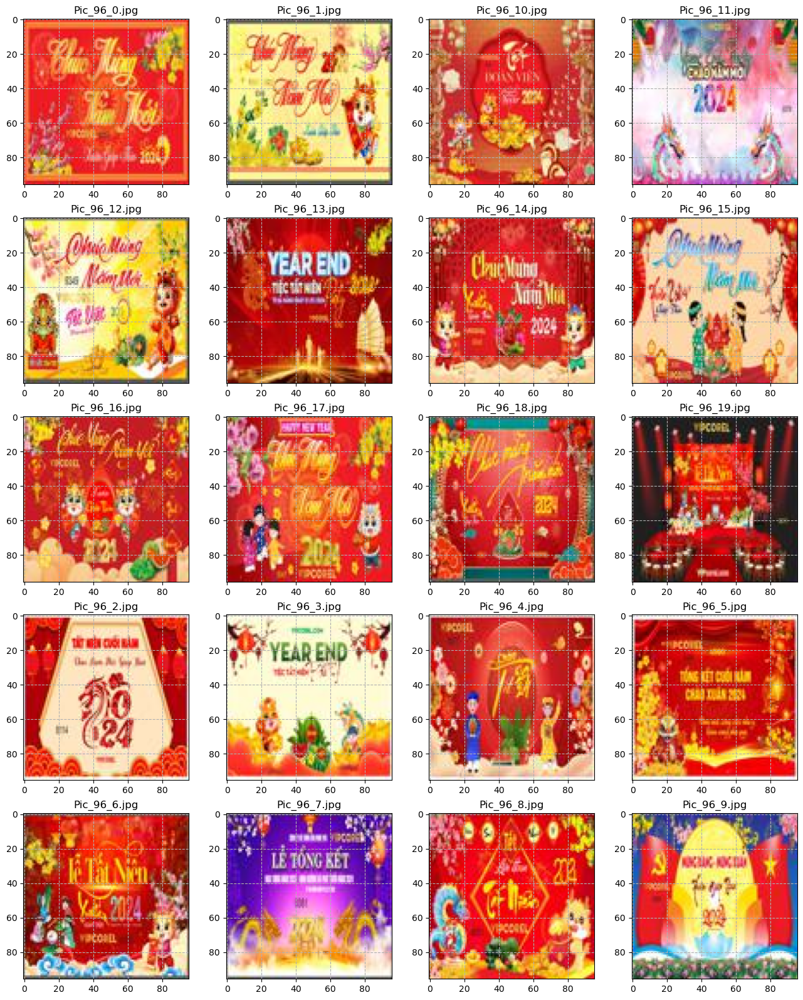

In [33]:
#HIỂN THỊ TOÀN BỘ ẢNH TRONG THƯ MỤC
import pathlib
#Lấy danh sách tên file có trong thư mục
pic_2024_new = list(pathlib.Path(path_new).glob('*'))

#Thiết lập kiểu hiển thị
cot = 4
hang = len(pic_2024_new)//cot + 1

#Hiển thị nhiều ảnh sử dụng Matplotlib:
plt.figure(figsize=(4*cot,4*hang))
for count, filename in enumerate(pic_2024_new):
    #Đọc từng ảnh theo chế độ mặc định
    img = cv2.imread(str(filename))
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    #Thiết lập khung hiển thị gồm 5 hàng và 4 cột
    ax = plt.subplot(hang,cot,count+1)
    #Hiển thị ảnh
    plt.imshow(img)
    #lấy tên file hiển thị
    plt.title(str(filename).split("\\")[-1])
    plt.grid(ls='--')
    plt.axis('on')
    
plt.show()

## 2. Cắt ảnh (Cropping Images)
---
Thực hiện cắt một phần của ảnh, sử dụng phương pháp tách các phần tử trong ma trận:
* Ảnh nhị phân, ảnh xám --> Ma trận [hàng (chiều cao ảnh), côt (chiều rộng ảnh)]
* Ảnh màu ---> Mảng 3 chiều [hàng (chiều cao ảnh), côt (chiều rộng ảnh),màu (BGR)]

**img_cropped = img[start_row:end_row, start_col:end_col]**

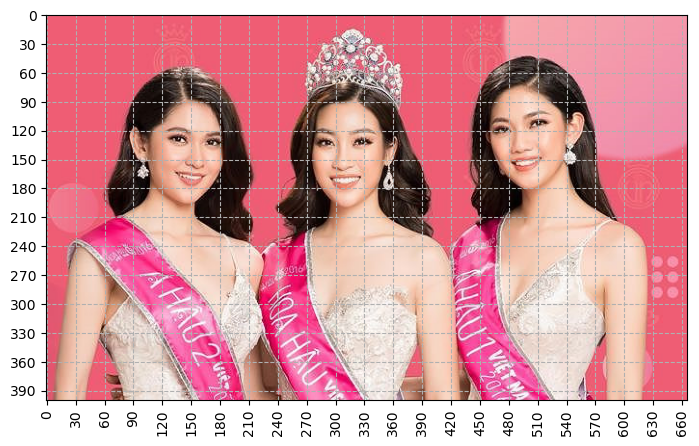

In [35]:
#Đọc ảnh màu:
img_miss = cv2.imread('images/MissVN.jpg')

#Chuyển sang hệ màu RGB để hiện thị:
img_miss = cv2.cvtColor(img_miss,cv2.COLOR_BGR2RGB)

#Tạo khoảng chia của lưới:
ax = np.arange(0,img_miss.shape[1],30) #Tạo các tick cho trục x
ay = np.arange(0,img_miss.shape[0],30) #Tạo các tick cho trục y

#Hiển thị ảnh:
plt.figure(figsize=(10,5))
plt.imshow(img_miss)
# tạo các lưới sao cho dày hơn
plt.xticks(ax, rotation=90) # tạo các tick trục x
plt.yticks(ay) # tao các tick trục y
plt.grid(ls='--')
plt.show()

In [36]:
#Kích thước ảnh gốc:
print(img_miss.shape)

(400, 666, 3)


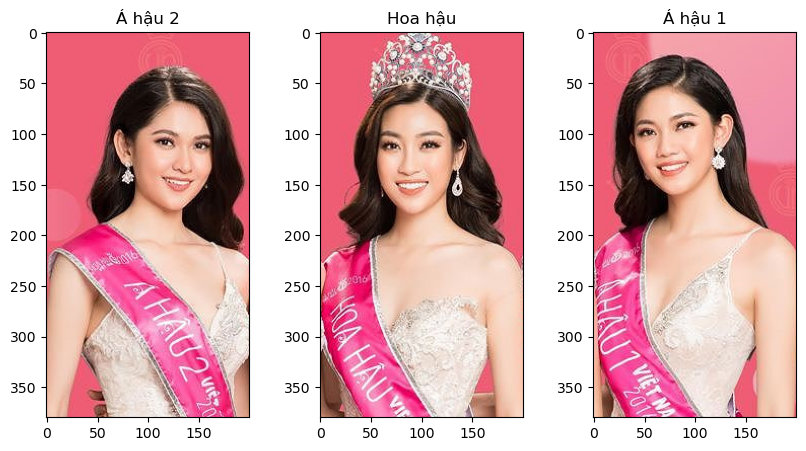

In [37]:
#Cắt lấy từng người trong ảnh gốc:
img_ahau2 = img_miss[20:,20:220]
img_hoahau = img_miss[20:,220:420]
img_ahau1 = img_miss[20:,420:620]

#Hiển thị kết quả:
plt.figure(figsize=(10,5))
plt.subplot(1, 3, 1)
plt.imshow(img_ahau2)
plt.title('Á hậu 2')

plt.subplot(1, 3, 2)
plt.imshow(img_hoahau)
plt.title('Hoa hậu')

plt.subplot(1, 3, 3)
plt.imshow(img_ahau1)
plt.title('Á hậu 1')

plt.show()

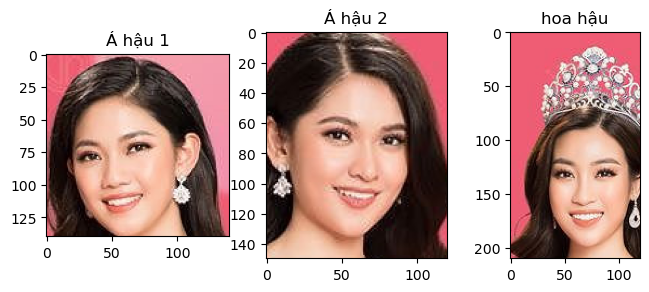

In [38]:
#Chỉ Cắt lấy khuôn mặt trong ảnh và hiển thị
face_ahau1 = img_miss[40:180,440:580]
face_ahau2 = img_miss[60:210,90:210]
face_hoahau = img_miss[0:210,240:360]

# hiển thị khuôn mặt á hậu 1
plt.figure(figsize=(8,10))
plt.subplot(3,3,1)
plt.imshow(face_ahau1)
plt.title('Á hậu 1')

plt.subplot(3,3,2)
plt.imshow(face_ahau2)
plt.title('Á hậu 2')

plt.subplot(3,3,3)
plt.imshow(face_hoahau)
plt.title('hoa hậu')


plt.show()





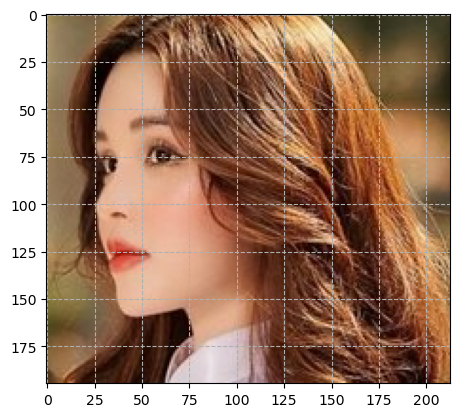

In [39]:
#CẮT ẢNH THEO MỘT VÙNG LỰA CHỌN BẰNG CHUỘT VỚI PHƯƠNG THỨC selectROI:
import cv2
import numpy as np
import matplotlib.pyplot as plt  
  
#Đọc ảnh:
img_miss = cv2.imread('images/Pic_1.jpg')
  
# Select ROI: Lấy một vùng trong ảnh --> Toạ độ của vùng ảnh 
r = cv2.selectROI("select the area", img_miss)
  
#Cắt ảnh theo vùng được chọn
cropped_image = img_miss[int(r[1]):int(r[1]+r[3]), 
                      int(r[0]):int(r[0]+r[2])]
#lấy ra các góc và có thể select vùng chọn để cắt
  
# Hiển thị ảnh đã cắt:
plt.imshow(cv2.cvtColor(cropped_image,cv2.COLOR_BGR2RGB))
plt.grid(ls='--')
plt.show()

## THỰC HÀNH 2.2: 
---
Yêu cầu :
* Sinh viên đọc và hiển thị ảnh images/Thuchanh_2_2.jpg ở dạng ảnh xám.
* Cắt lấy từng con số và ký tự có trong ảnh, Hiển thị và lưu ảnh đã cắt vào thư mục images/Saves/ với tên tương ứng là MSV_kytutuongung.jpg
<img src = 'images/Thuchanh_2_2.jpg' width='300px'>

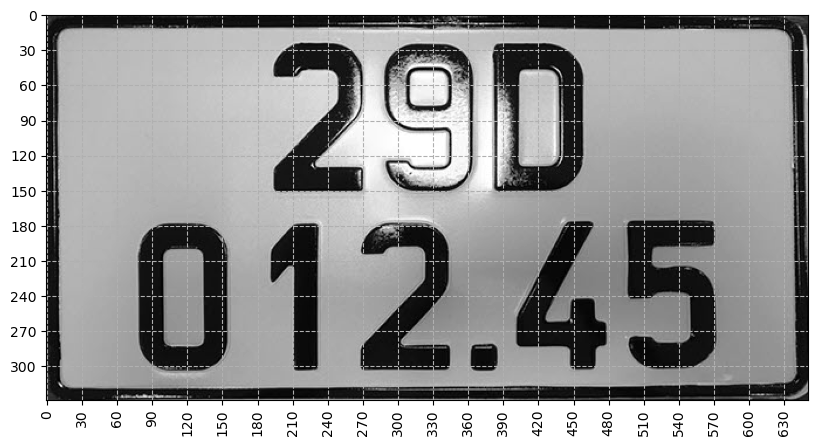

In [2]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY:}
#Đọc ảnh xám:

img_th2 = cv2.imread('images/Thuchanh_2_2.jpg',0)

#Tạo khoảng chia của lưới:
ax = np.arange(0,img_th2.shape[1],30) #Tạo các tick cho trục x
ay = np.arange(0,img_th2.shape[0],30) #Tạo các tick cho trục y

#Hiển thị ảnh:
plt.figure(figsize=(10,5))
plt.imshow(img_th2,cmap='gray')
# tạo các lưới sao cho dày hơn
plt.xticks(ax, rotation=90) # tạo các tick trục x
plt.yticks(ay) # tao các tick trục y
plt.grid(ls='--')
plt.show()

In [69]:
th2_1 = img_th2[25:150,195:270] #số 2 
th2_2 = img_th2[25:150,288:365]# Số 9 
th2_3 = img_th2[25:150,382:460]# Chữ D 
th2_4 = img_th2[180:305,80:158]# Số 0 
th2_5 = img_th2[178:305,191:234] # Số 1
th2_6 = img_th2[178:305,270:346] # số 2 
th2_7 = img_th2[176:305,400:480] # Số 4 
th2_8 = img_th2[178:305,495:570] # Số 5 

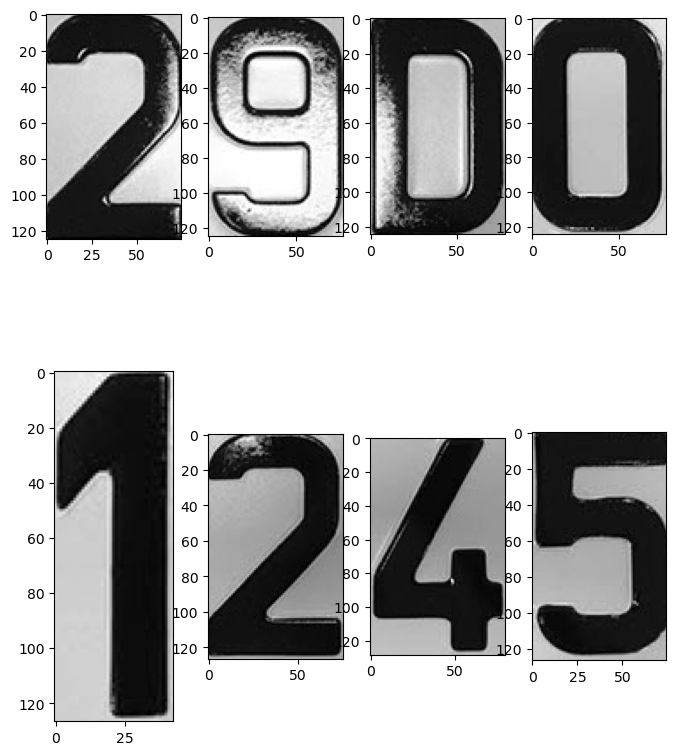

In [70]:
# hiển thị các ký tự trong ảnh
plt.figure(figsize=(8,10))

# Hiển thị số 2
plt.subplot(2,4,1)
plt.imshow(th2_1,cmap='gray')

# Hiển thị số 9
plt.subplot(2,4,2)
plt.imshow(th2_2,cmap='gray')

# Hiển thị chữ D
plt.subplot(2,4,3)
plt.imshow(th2_3,cmap='gray')

# Hiển thị số 0
plt.subplot(2,4,4)
plt.imshow(th2_4,cmap='gray')


# Hiển thị số 1
plt.subplot(2,4,5)
plt.imshow(th2_5,cmap='gray')


# Hiển thị số 2
plt.subplot(2,4,6)
plt.imshow(th2_6,cmap='gray')


# Hiển thị số 4
plt.subplot(2,4,7)
plt.imshow(th2_7,cmap='gray')



#Hiển thị số 5
plt.subplot(2,4,8)
plt.imshow(th2_8,cmap='gray')


plt.show()


In [76]:
# Lưu ảnh vừa cắt ra
cv2.imwrite('images/Saves/2121050720_so2.jpg',   th2_1)
cv2.imwrite('images/Saves/2121050720_so9.jpg',   th2_2)
cv2.imwrite('images/Saves/2121050720_chuD.jpg',  th2_3)
cv2.imwrite('images/Saves/2121050720_so0.jpg',   th2_4)
cv2.imwrite('images/Saves/2121050720_so1.jpg',   th2_5)
cv2.imwrite('images/Saves/2121050720_so2_2.jpg', th2_6)
cv2.imwrite('images/Saves/2121050720_so4.jpg',   th2_7)
cv2.imwrite('images/Saves/2121050720_so5.jpg',   th2_8)

True

## 3. Xoay ảnh (Rotate Images)
---
OpenCV hỗ trợ phương thức xoay ảnh:
 **cv2.rotate(img, rotateCode)**
 
 Trong đó:
 1. img: ảnh gốc muốn xoay
 2. rotateCode: các chế độ xoay ảnh:
     * cv2.ROTATE_90_CLOCKWISE: Xoay 90 độ theo chiều kim đồng hồ
     * cv2.ROTATE_90_COUNTERCLOCKWISE: Xoay 90 độ ngược chiều kim đồng hồ
     * cv2.ROTATE_180: Xoay ảnh 180 (lật ảnh)

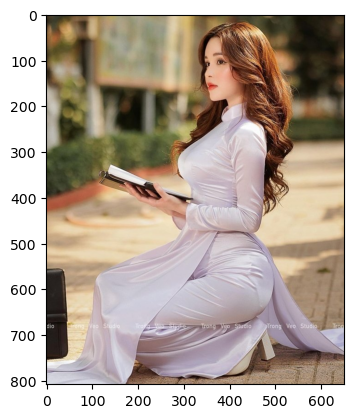

In [77]:
#Đọc ảnh màu:
img = cv2.imread('images/Pic_1.jpg')

#Chuyển sang hệ màu RGB để hiện thị:
img_miss = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh:
plt.imshow(img_miss)
plt.show()

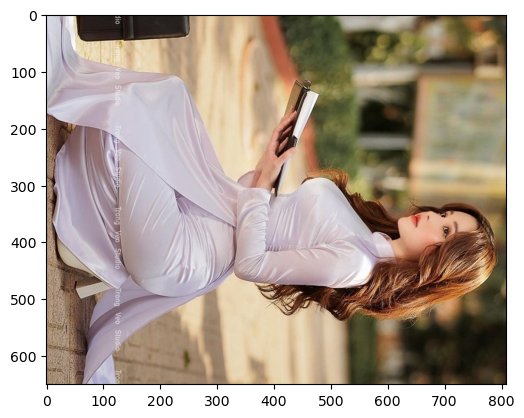

In [78]:
#Xoay ảnh 90 độ theo chiều kim đồng hồ:
img_rotate_90_clockwise = cv2.rotate(img_miss, 
                                     cv2.ROTATE_90_CLOCKWISE)
#Hiển thị ảnh đã xoay:
plt.imshow(img_rotate_90_clockwise)
plt.show()

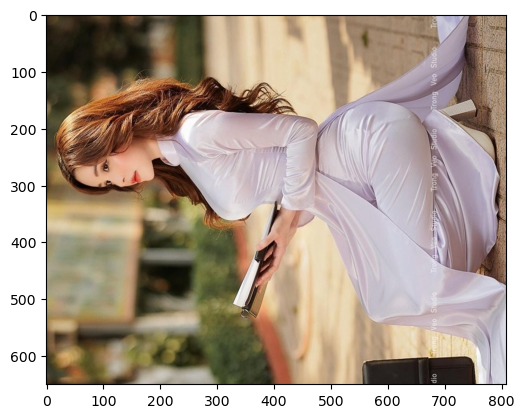

In [79]:
#Xoay ảnh 90 độ ngược chiều kim đồng hồ:
img_rotate_90_counterclockwise = cv2.rotate(img_miss, 
                                            cv2.ROTATE_90_COUNTERCLOCKWISE)

#Hiển thị ảnh đã xoay:
plt.imshow(img_rotate_90_counterclockwise)
plt.show()

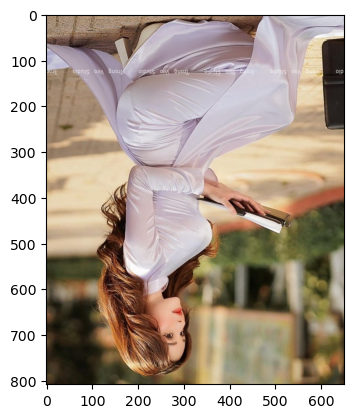

In [80]:
#Xoay ảnh 180 độ:
img_rotate_180 = cv2.rotate(img_miss, 
                            cv2.ROTATE_180)

#Hiển thị đã xoay:
plt.imshow(img_rotate_180)
plt.show()

## 4. Lật ảnh (Flip Images)
---
OpenCV hỗ trợ phương thức lật ảnh:
 **cv2.flip(img, flipCode)**
 
 Trong đó:
 1. img: ảnh gốc muốn xoay
 2. flipCode: các chế độ lật ảnh:
     * flipCode = 0: Lật ảnh theo chiều ngang
     * flipCode > 0: Lật ảnh theo chiều dọc
     * flipCode < 0: Lật ảnh theo chiều ngang và dọc

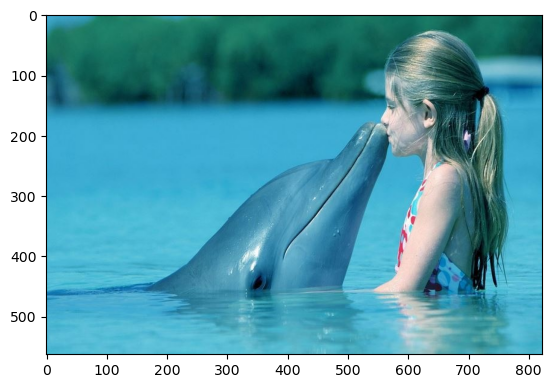

In [81]:
#Đọc ảnh màu:
img = cv2.imread('images/fish.jpg')

#Chuyển sang hệ màu RGB để hiện thị:
img_fish = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh:
plt.imshow(img_fish)
plt.show()

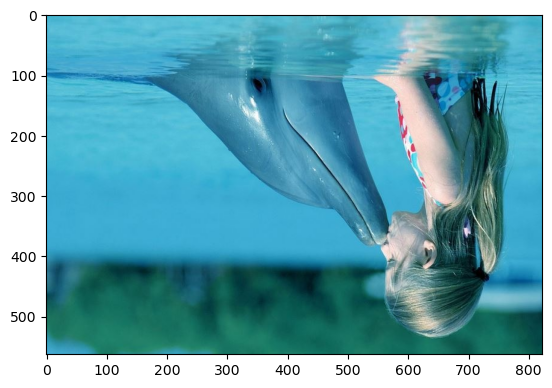

In [82]:
#Lật ảnh theo chiều ngang (trục X): flipCode = 0
img_flip_ud = cv2.flip(img_fish, 0)

#Hiển thị ảnh đã lật:
plt.imshow(img_flip_ud)
plt.show()

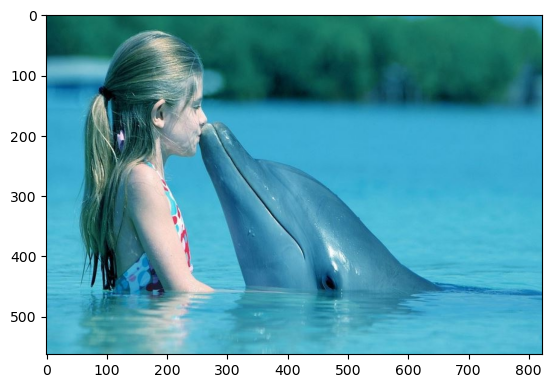

In [83]:
#Lật ảnh theo chiều dọc (trục Y): flipCode > 0
img_flip_lr = cv2.flip(img_fish, 1)

#Hiển thị ảnh đã lật:
plt.imshow(img_flip_lr)
plt.show()

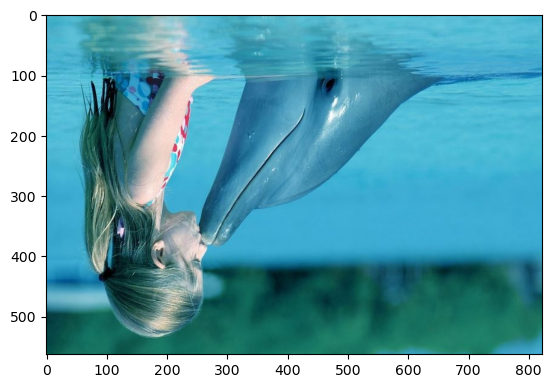

In [84]:
#Lật ảnh theo cả 2 chiều ngang, dọc (theo trục Y, X): flipCode < 0
img_flip_up_lr = cv2.flip(img_fish, -1)

#Hiển thị ảnh đã lật:
plt.imshow(img_flip_up_lr)
plt.show()

## THỰC HÀNH 2.3: 
---
Yêu cầu :
* Sinh viên đọc và hiển thị ảnh images/Thuchanh_2_3.jpg ở chế độ mặc định.
* Thực hiện xoay ảnh 90 độ thuận và ngược chiều kim đồng hồ.
* Thực hiện lật ảnh theo chiều ngang và dọc
* Hiển thị và lưu các ảnh đã xoay, lật vào thư mục images/Saves/
<img src = 'images/Thuchanh_2_3.jpg' width='300px'>

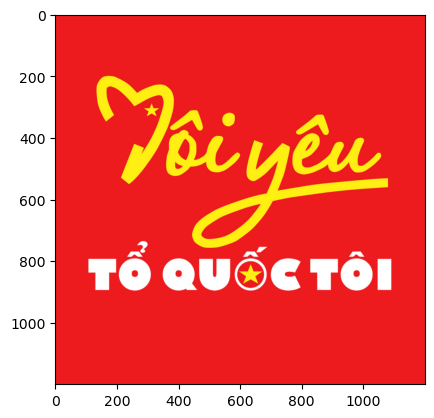

In [86]:
#{SINH VIÊN VIẾT CODE VÀO ĐÂY}
#Đọc ảnh
th3_img = cv2.imread('images/Thuchanh_2_3.jpg',1)
#Chuyển sang hệ màu RGB để hiện thị:
th3_img = cv2.cvtColor(th3_img,cv2.COLOR_BGR2RGB)

#Hiển thị ảnh:
plt.imshow(th3_img)
plt.show()

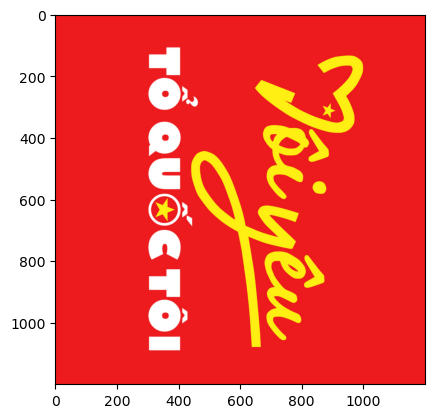

In [87]:
#Xoay ảnh 90 độ theo chiều kim đồng hồ:
th3_rotate_90_clockwise = cv2.rotate(th3_img, 
                                     cv2.ROTATE_90_CLOCKWISE)
#Hiển thị ảnh đã xoay:
plt.imshow(th3_rotate_90_clockwise)
plt.show()

In [91]:
# Lưu ảnh đã bị xoay theo chiều kim đồng hồ
cv2.imwrite('images/Saves/th3_rotate_90_clockwise.jpg', th3_rotate_90_clockwise)

True

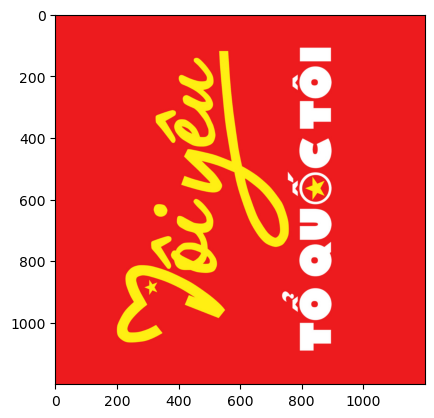

In [88]:
#Xoay ảnh 90 độ ngược chiều kim đồng hồ:
th3_rotate_90_counterclockwise = cv2.rotate(th3_img, 
                                            cv2.ROTATE_90_COUNTERCLOCKWISE)

#Hiển thị ảnh đã xoay:
plt.imshow(th3_rotate_90_counterclockwise)
plt.show()

In [92]:
# Lưu ảnh đã bị xoay theo chiều ngược kim đồng hồ
cv2.imwrite('images/Saves/th3_rotate_90_counterclockwise.jpg', th3_rotate_90_counterclockwise)

True

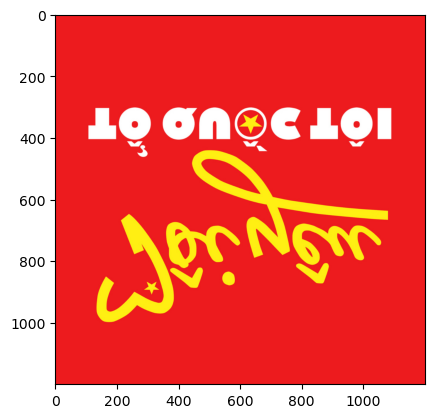

In [89]:
#Lật ảnh theo chiều ngang (trục X): flipCode = 0
th3_img_flip_ud = cv2.flip(th3_img, 0)

#Hiển thị ảnh đã lật:
plt.imshow(th3_img_flip_ud)
plt.show()

In [93]:
# Lưu ảnh đã được lật ngang
cv2.imwrite('images/Saves/th3_img_flip_ud.jpg', th3_img_flip_ud)

True

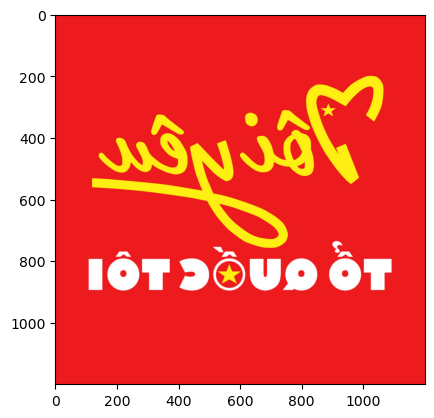

In [90]:
#Lật ảnh theo chiều dọc (trục Y): flipCode > 0
th3_img_flip_lr = cv2.flip(th3_img, 1)

#Hiển thị ảnh đã lật:
plt.imshow(th3_img_flip_lr)
plt.show()

In [94]:
# Lưu ảnh được lật dọc
cv2.imwrite('images/Saves/th3_img_flip_lr.jpg', th3_img_flip_lr)

True

In [ ]:
# buổi sau 16/3 có bài kiểm tra thực hành trên máy b1 trên lớp